In [1]:
!pip install diffusers transformers accelerate

  Using cached httpx-0.28.1-py3-none-any.whl.metadata (7.1 kB)
  Using cached numpy-2.4.4-cp314-cp314-macosx_14_0_arm64.whl.metadata (6.6 kB)
  Using cached safetensors-0.7.0-cp38-abi3-macosx_11_0_arm64.whl.metadata (4.1 kB)
  Using cached pillow-12.2.0-cp314-cp314-macosx_11_0_arm64.whl.metadata (8.8 kB)
  Using cached anyio-4.13.0-py3-none-any.whl.metadata (4.5 kB)
  Using cached certifi-2026.2.25-py3-none-any.whl.metadata (2.5 kB)
  Using cached httpcore-1.0.9-py3-none-any.whl.metadata (21 kB)
  Using cached idna-3.11-py3-none-any.whl.metadata (8.4 kB)
  Using cached h11-0.16.0-py3-none-any.whl.metadata (8.3 kB)
  Using cached pyyaml-6.0.3-cp314-cp314-macosx_11_0_arm64.whl.metadata (2.4 kB)
  Using cached tqdm-4.67.3-py3-none-any.whl.metadata (57 kB)
  Using cached typer-0.24.1-py3-none-any.whl.metadata (16 kB)
  Using cached typing_extensions-4.15.0-py3-none-any.whl.metadata (3.3 kB)
  Using cached tokenizers-0.22.2-cp39-abi3-macosx_11_0_arm64.whl.metadata (7.3 kB)
  Using cached sy

In [8]:
import os

# Desactivar token implícito ANTES de importar diffusers/huggingface_hub
os.environ["HF_HUB_DISABLE_IMPLICIT_TOKEN"] = "1"

import torch
from diffusers import StableDiffusionPipeline

# Detectar dispositivo disponible
if torch.cuda.is_available():
    device = "cuda"
    dtype = torch.float16
elif torch.backends.mps.is_available():
    device = "mps"
    dtype = torch.float32
else:
    device = "cpu"
    dtype = torch.float32

print(f"Usando dispositivo: {device}")

# CompVis/stable-diffusion-v1-4: modelo público, misma arquitectura que v1.5
model_id = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=dtype,
    token=None
)

pipe = pipe.to(device)

print("✅ Modelo cargado y listo para usar en", device)


Usando dispositivo: mps


Loading weights: 100%|██████████| 396/396 [00:00<00:00, 7460.16it/s]]
StableDiffusionSafetyChecker LOAD REPORT from: /Users/serkiolara/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
Loading weights: 100%|██████████| 196/196 [00:00<00:00, 7513.93it/s]5.61it/s]
CLIPTextModel LOAD REPORT from: /Users/serkiolara/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/133a221b8aa7292a167afc5127cb63fb5005638b/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED

✅ Modelo cargado y listo para usar en mps


Generando imagen con 25 pasos y escala 7.5...


100%|██████████| 25/25 [00:31<00:00,  1.25s/it]


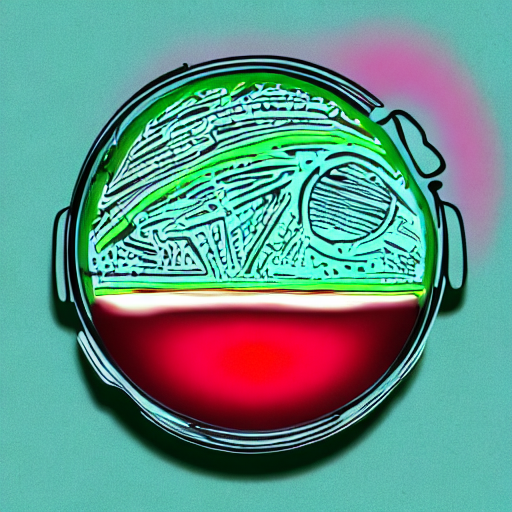

In [9]:

# --- PANEL DE CONTROL PARA LA ACTIVIDAD ---
prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25          # EXPERIMENTO A: Cambiar a 1, 10, 25, 50 (U-Net)
obediencia = 7.5    # EXPERIMENTO B: Cambiar a 1, 7.5, 30 (CLIP)
semilla = 42        # EXPERIMENTO C: Cambiar para navegar el Espacio Latente

# Configuramos la semilla para tener control total
generator = torch.Generator().manual_seed(semilla)

# Proceso de generación
# Aquí la U-Net empieza a quitar ruido basándose en el prompt
print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

# Guardar y mostrar
image.save("resultado_lab.png")
display(image)


Generando imagen con 25 pasos y escala 7.5...


100%|██████████| 25/25 [00:45<00:00,  1.82s/it]


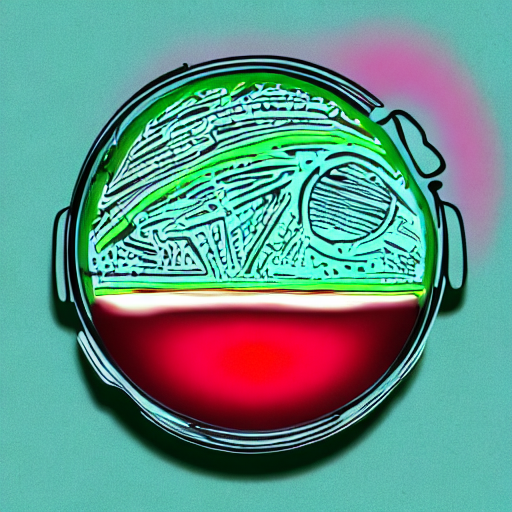

In [10]:
# --- PANEL DE CONTROL PARA LA ACTIVIDAD ---
prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25          # EXPERIMENTO A: Cambiar a 1, 10, 25, 50 (U-Net)
obediencia = 7.5    # EXPERIMENTO B: Cambiar a 1, 7.5, 30 (CLIP)
semilla = 42        # EXPERIMENTO C: Cambiar para navegar el Espacio Latente

# Configuramos la semilla para tener control total
generator = torch.Generator().manual_seed(semilla)

# Proceso de generación
# Aquí la U-Net empieza a quitar ruido basándose en el prompt
print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

# Guardar y mostrar
image.save("resultado_lab.png")
display(image)


Generando imagen con 25 pasos y escala 7.5...


100%|██████████| 25/25 [00:42<00:00,  1.69s/it]


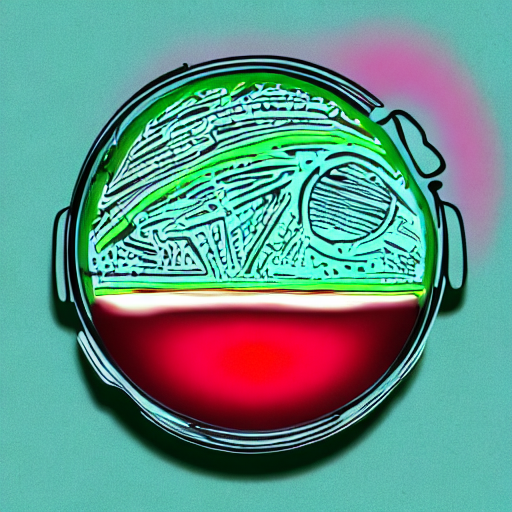

In [11]:
# --- PANEL DE CONTROL PARA LA ACTIVIDAD ---
prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25          # EXPERIMENTO A: Cambiar a 1, 10, 25, 50 (U-Net)
obediencia = 7.5    # EXPERIMENTO B: Cambiar a 1, 7.5, 30 (CLIP)
semilla = 42        # EXPERIMENTO C: Cambiar para navegar el Espacio Latente

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("resultado_lab.png")
display(image)


Generando imagen con 25 pasos y escala 7.5...


100%|██████████| 25/25 [00:47<00:00,  1.88s/it]


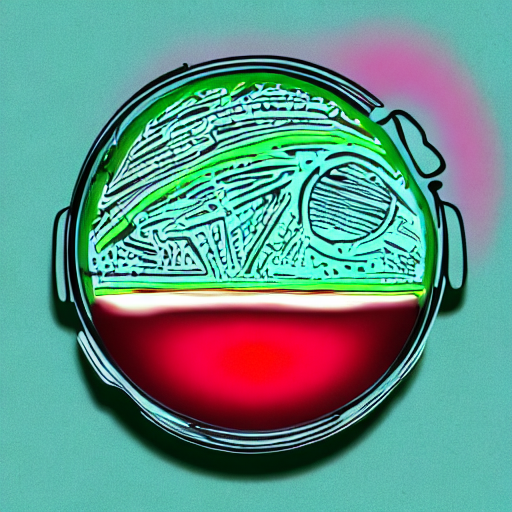

In [12]:
# --- PANEL DE CONTROL PARA LA ACTIVIDAD ---
prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25          # EXPERIMENTO A: Cambiar a 1, 10, 25, 50 (U-Net)
obediencia = 7.5    # EXPERIMENTO B: Cambiar a 1, 7.5, 30 (CLIP)
semilla = 42        # EXPERIMENTO C: Cambiar para navegar el Espacio Latente

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("resultado_lab.png")
display(image)


Experimento A

Generando imagen con 1 pasos y escala 7.5...


100%|██████████| 1/1 [00:13<00:00, 13.05s/it]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


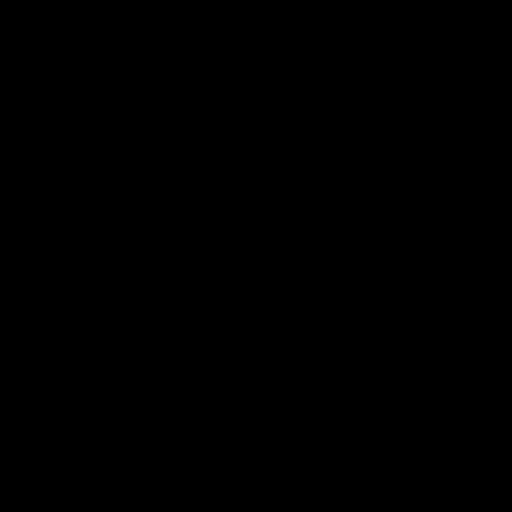

In [13]:
import torch

prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 1
obediencia = 7.5
semilla = 42

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("A1_pasos_1.png")
display(image)


Generando imagen con 10 pasos y escala 7.5...


100%|██████████| 10/10 [00:44<00:00,  4.48s/it]


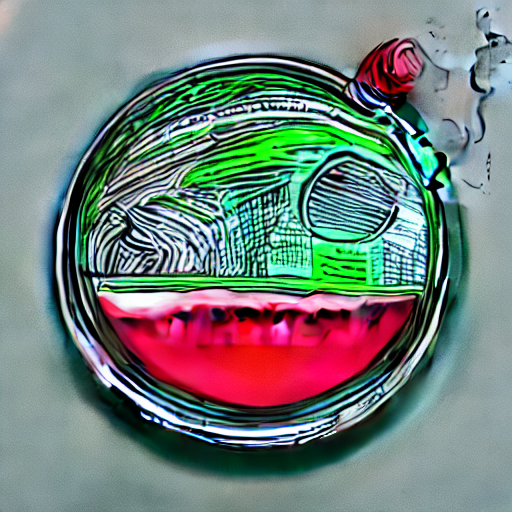

In [14]:
import torch

prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 10
obediencia = 7.5
semilla = 42

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("A2_pasos_10.png")
display(image)


Generando imagen con 25 pasos y escala 7.5...


100%|██████████| 25/25 [00:46<00:00,  1.85s/it]


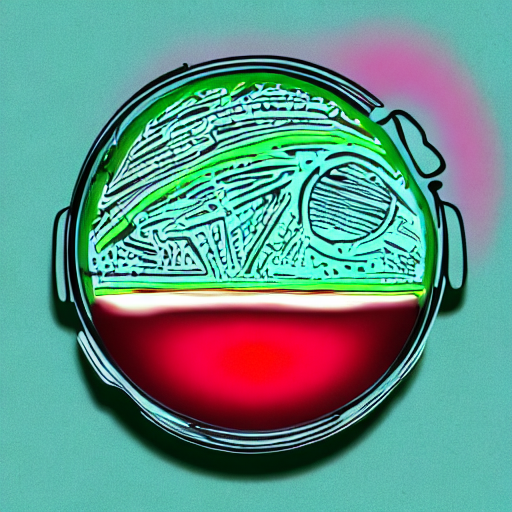

In [15]:
import torch

prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25
obediencia = 7.5
semilla = 42

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("A3_pasos_25.png")
display(image)


Generando imagen con 50 pasos y escala 7.5...


100%|██████████| 50/50 [00:56<00:00,  1.13s/it]


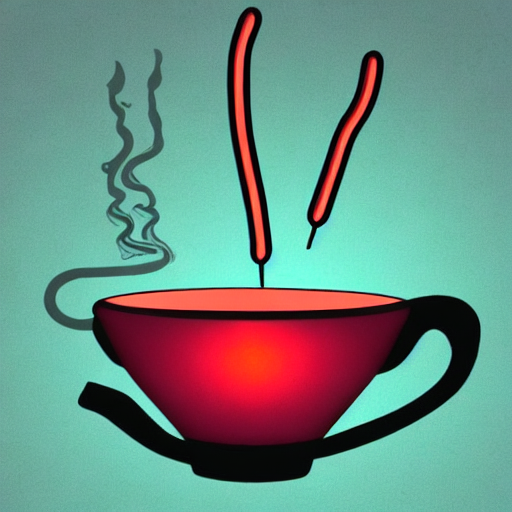

In [16]:
import torch

prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 50
obediencia = 7.5
semilla = 42

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("A4_pasos_50.png")
display(image)


Experimento B

Generando imagen con 25 pasos y escala 1...


  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 25/25 [00:22<00:00,  1.11it/s]


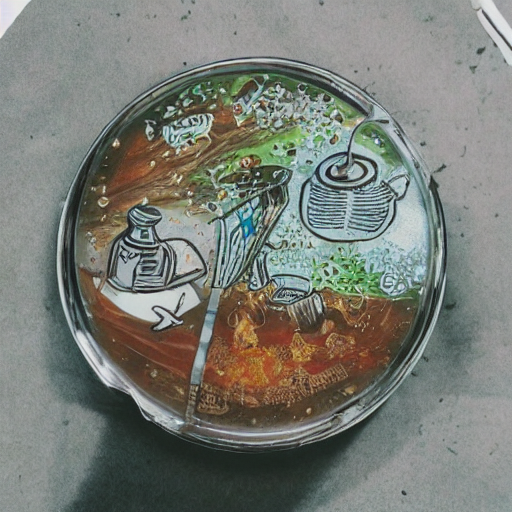

In [17]:
import torch

prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25
obediencia = 1
semilla = 42

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("B1_obediencia_1.png")
display(image)


Generando imagen con 25 pasos y escala 7.5...


100%|██████████| 25/25 [00:46<00:00,  1.85s/it]


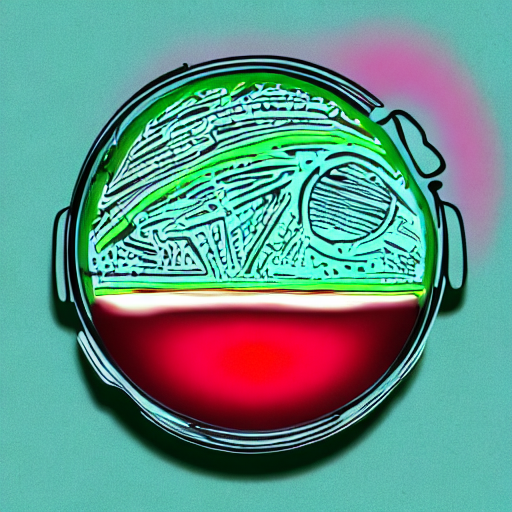

In [18]:
import torch

prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25
obediencia = 7.5
semilla = 42

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("B2_obediencia_7_5.png")
display(image)


Generando imagen con 25 pasos y escala 30...


100%|██████████| 25/25 [00:41<00:00,  1.65s/it]


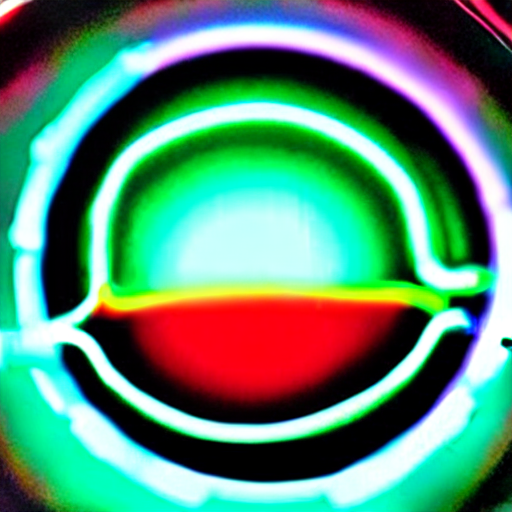

In [19]:
import torch

prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25
obediencia = 30
semilla = 42

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con {pasos} pasos y escala {obediencia}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("B3_obediencia_30.png")
display(image)


Experimento C

Generando imagen con semilla 42...


100%|██████████| 25/25 [00:43<00:00,  1.75s/it]


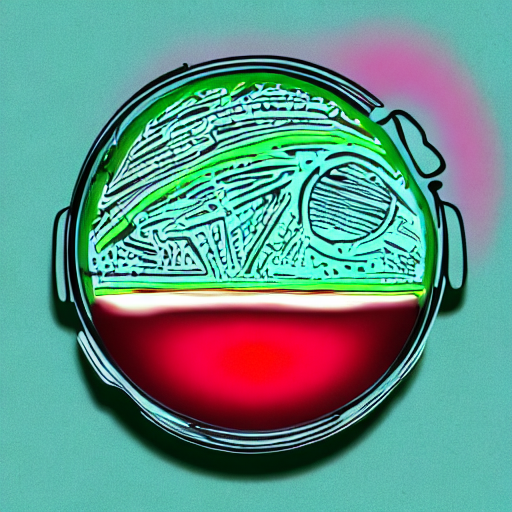

In [20]:
import torch

prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25
obediencia = 7.5
semilla = 42

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con semilla {semilla}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("C1_semilla_42.png")
display(image)


Generando imagen con semilla 123...


100%|██████████| 25/25 [00:40<00:00,  1.60s/it]


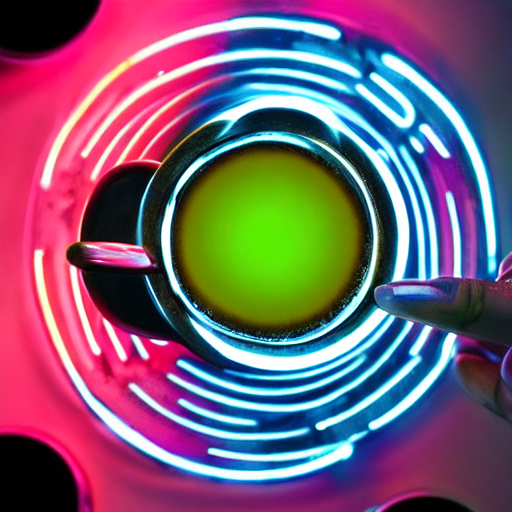

In [21]:
import torch

prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25
obediencia = 7.5
semilla = 123

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con semilla {semilla}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("C2_semilla_123.png")
display(image)


Generando imagen con semilla 999...


100%|██████████| 25/25 [00:39<00:00,  1.58s/it]


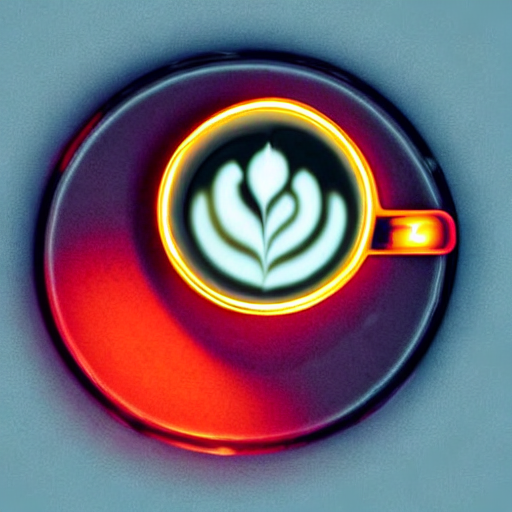

In [22]:
import torch

prompt = "A futuristic cup of coffee, neon glowing liquid, highly detailed"
pasos = 25
obediencia = 7.5
semilla = 999

generator = torch.Generator().manual_seed(semilla)

print(f"Generando imagen con semilla {semilla}...")

image = pipe(
    prompt,
    num_inference_steps=pasos,
    guidance_scale=obediencia,
    generator=generator
).images[0]

image.save("C3_semilla_999.png")
display(image)
